In [11]:
from astropy.io import fits
import numpy as np
import os
import matplotlib.pyplot as plt
from astropy.stats import SigmaClip
from photutils.background import Background2D, SExtractorBackground
from mpl_toolkits.axes_grid1 import make_axes_locatable
from astropy.visualization import LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from scipy import ndimage
from scipy.ndimage import gaussian_filter
import little_things_functions as ltf
import cv2
from scipy.optimize import curve_fit
from matplotlib.patches import Ellipse


# DDO 43

## R_25

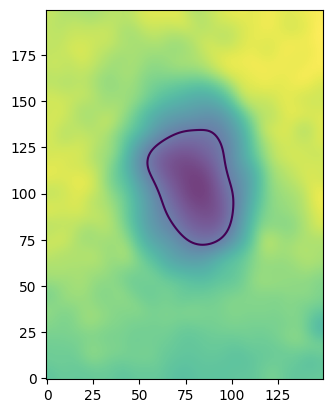

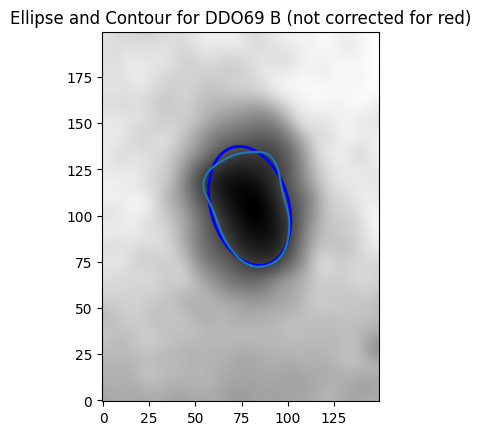

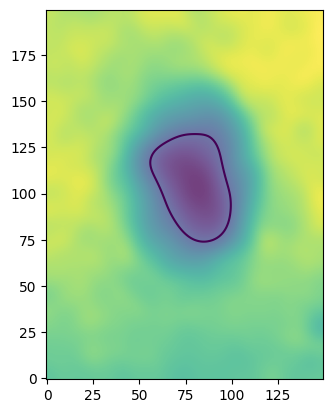

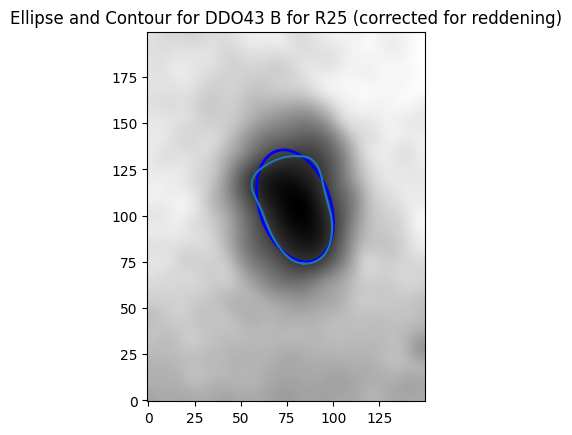

NOT corrected RB 25 for DDO43 is: 0.9975854395204415 kpc
CORRECTED RB 25 for DDO43 is: 0.9467168241981757 kpc
Paper value is 0.98 kpc


In [12]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO43\non_shifted_background_d43u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO43\non_shifted_background_d43b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO43\non_shifted_background_d43v.fits")
starless_v = starless_file_v[0].data

DDO43 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO43"
# Constants and parameters
pixel_scale = 1.134
D = 5.5
E_B_V = 0.05
filters = ["U", "B", "V"]
exposures = [1800, 1800, 900]
airmass_values = [1.33, 1.04 ,1.16]
mU_values = [5.251, 0.459, -0.121, 0.]
mV_values = [33.017, 0.137418, 0.045, 0.]
mB_values = [3.445, 0.2522084, -0.022, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 75
box_size_y = 100
box_center = (450, 460)
image_boxes = [DDO43[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO43))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 


# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print(f"NOT corrected RB 25 for {galaxy_name} is:", RB_25 * 1000, "kpc")
a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 0.98 kpc")

## R_H

Median of the center box: 30.205615497433673


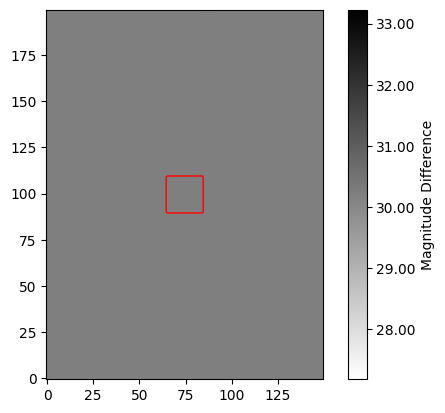

Holmberg mag threshold is 26.72


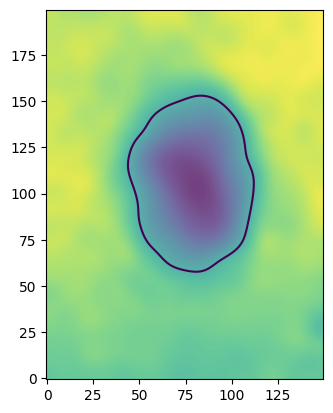

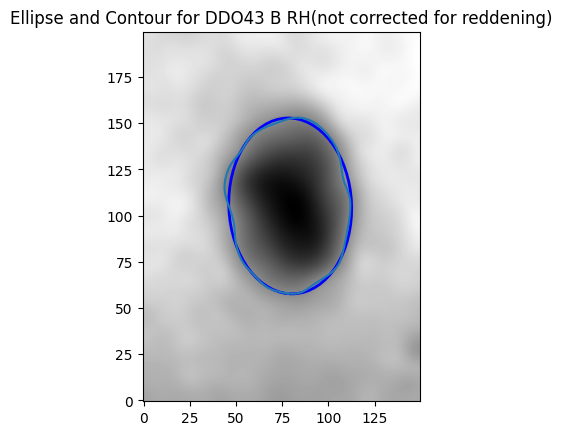

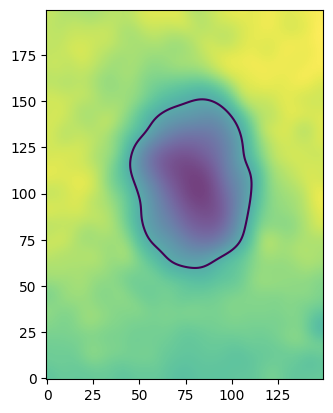

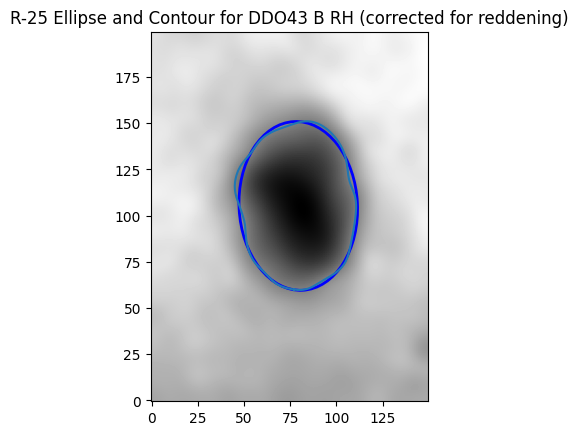

NOT corrected RH for DDO43 is: 1.4391854722706625 kpc
CORRECTED RB 25 for DDO43 is: 1.3816813077052752 kpc
Paper value is 1.42 kpc


In [13]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)
plt.show()

#Holmberg magnitude:
H = float(26.5 + 0.22)
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = b_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 1.42 kpc")

# DDO 69

## R25

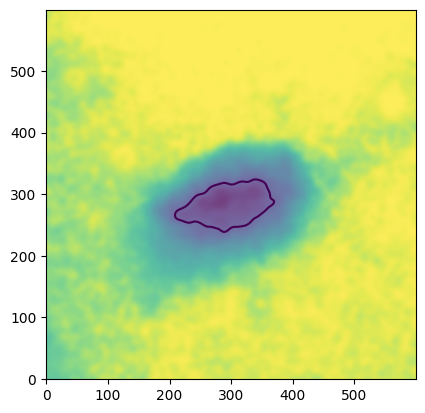

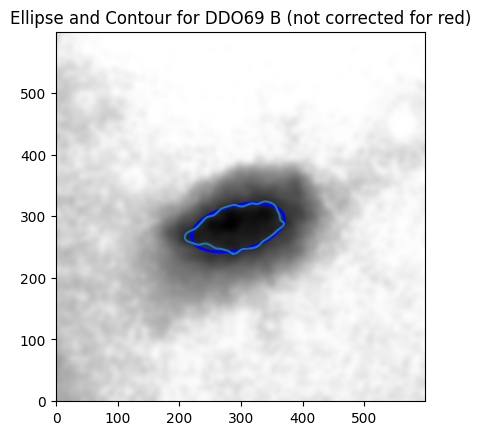

RB 25 for DDO69 is: 0.3387897360264195 kpc
Paper value is 0.30 kpc


In [14]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO69\non_shifted_background_d69u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO69\non_shifted_background_d69b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO69\non_shifted_background_d69v.fits")
starless_v = starless_file_v[0].data

DDO69 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO69"
# Constants and parameters
pixel_scale = 1.134
D = 0.8
E_B_V = 0.00
filters = ["U", "B", "V"]
exposures = [1800, 2400, 1200]
airmass_values = [1.22, 1.04, 1.1]
mU_values = [5.251, 0.459, -0.121, 0]
mV_values = [3.009, 0.2183592, 0.0415, 0.]
mB_values = [3.434, 0.3398903, -0.0157, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 300
box_size_y = 300
box_center = (520, 430)
image_boxes = [DDO69[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO69))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO69 is:", RB_25 * 1000, "kpc")
print("Paper value is 0.30 kpc")


Median of the center box: 0.24422993453990216


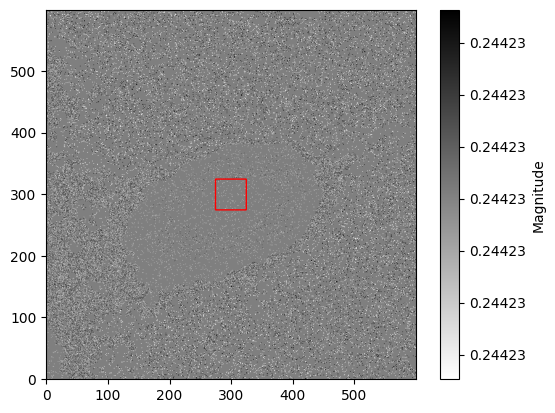

Holmberg mag threshold is 26.756390260246445


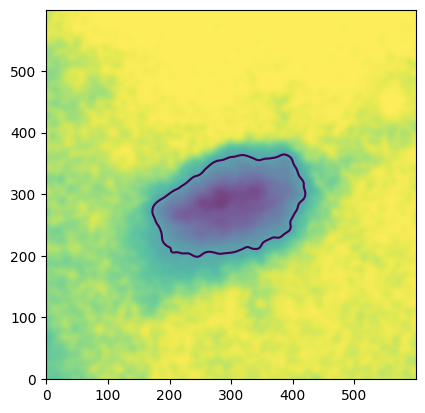

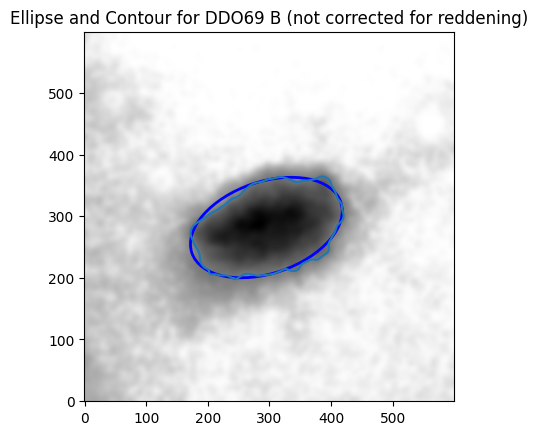

RH for DDO69 is: 0.561729771996861 kpc
Paper value is 0.56 kpc


In [15]:
import numpy as np
import matplotlib.pyplot as plt

B_V_magnitude_table = b_box - v_box

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 50

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r', vmin=np.nanmin(B_V_magnitude_table), vmax=np.nanmax(B_V_magnitude_table)) 
cbar = fig.colorbar(im, ax=ax, format='%.5f')
cbar.set_label('Magnitude')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()


fig, ax = plt.subplots()

#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B (not corrected for reddening)")
plt.show()
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 0.56 kpc")


# DDO 101

## R_25

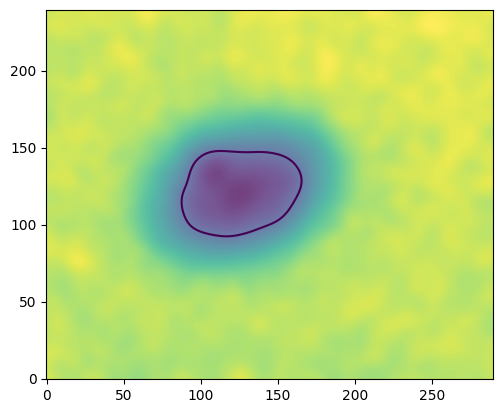

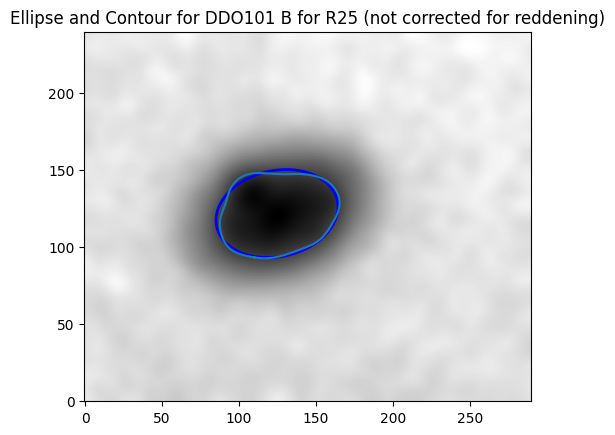

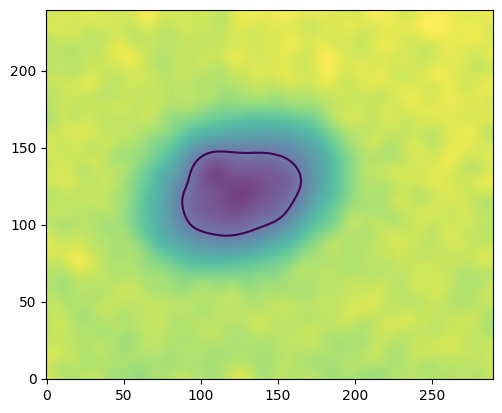

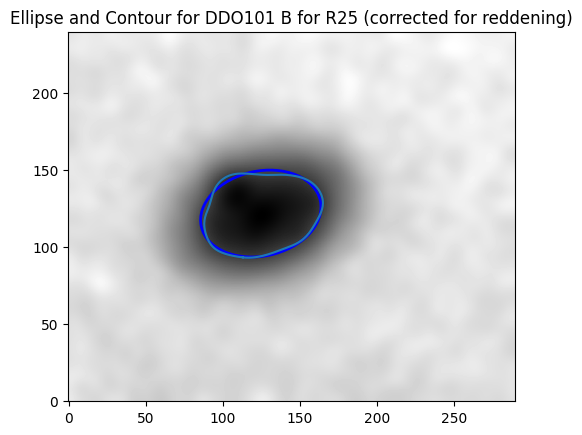

NOT corrected RB 25 for DDO101 is: 1.9818216200568466 kpc
CORRECTED RB 25 for DDO101 is: 1.9559754234607127 kpc
Paper value is 1.81 kpc


In [16]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO101\non_shifted_background_d101u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO101\non_shifted_background_d101b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO101\non_shifted_background_d101V.fits")
starless_v = starless_file_v[0].data

DDO101 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO101"
# Constants and parameters
pixel_scale = 1.134
D = 9.0
E_B_V = 0.01
airmass_values=[1.03, 1.015, 1.09]
exposures = [1800, 1800, 1200]
mU_values = [5.065, 0.514, -0.146, 0.]
mB_values = [3.445, 0.2373955, -0.022, 0.]
mV_values = [3.017, 0.1283061, 0.045, 0.]
m_values = [mU_values,mB_values,mV_values]

box_size_x = 145
box_size_y = 120
box_center = [450,500]

image_boxes = []
for i in range(0 , len(DDO101)):
        box = DDO101[i][box_center[1] - box_size_y : box_center[1] + box_size_y, box_center[0] - box_size_x : box_center[0] + box_size_x]
        image_boxes.append(box)

#--------------------------------------------------------------------------------------------------------------------------------------------------#
# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]
# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]
# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print(f"NOT corrected RB 25 for {galaxy_name} is:", RB_25 * 1000, "kpc")
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.81 kpc")

## R_H

Median of the center box: -0.07900230746897051


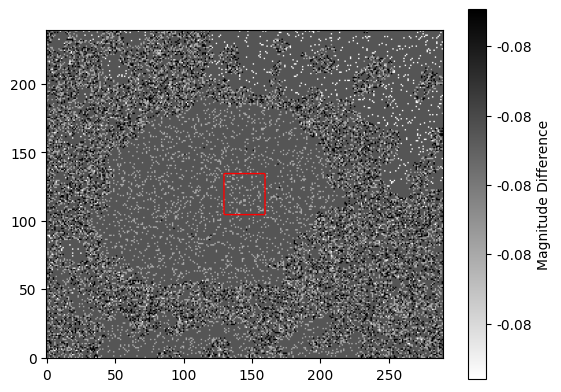

Holmberg mag threshold is 26.70822865618712


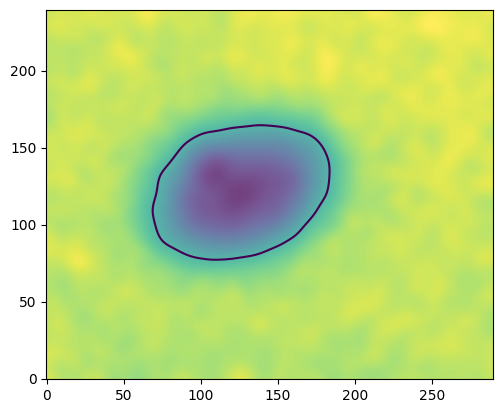

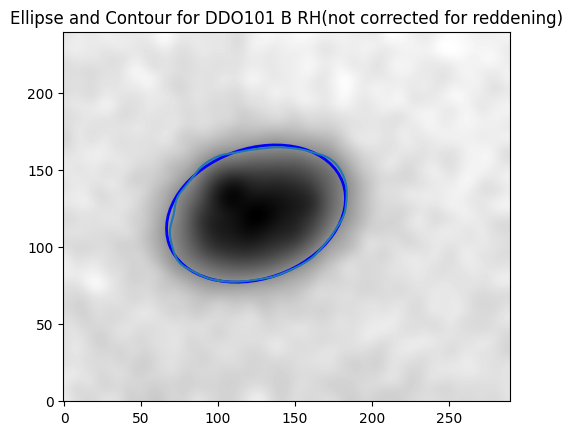

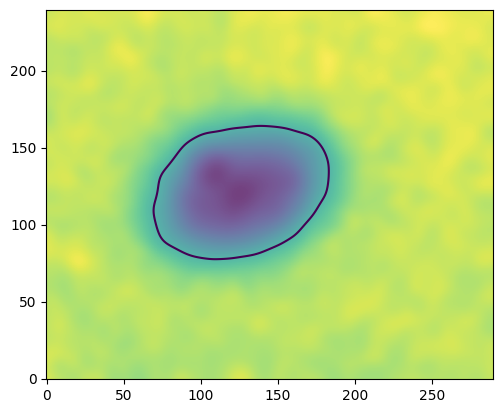

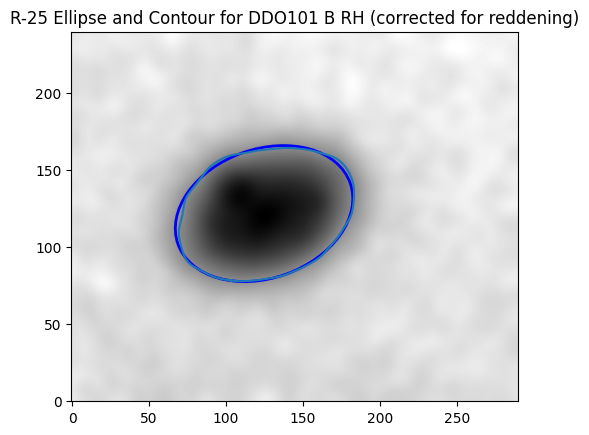

NOT corrected RH for DDO101 is: 2.959571255304675 kpc
CORRECTED RB 25 for DDO101 is: 2.9344969880762193 kpc
Paper value is 2.76 kpc


In [17]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show() 

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = a_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 2.76 kpc")

# DD0126

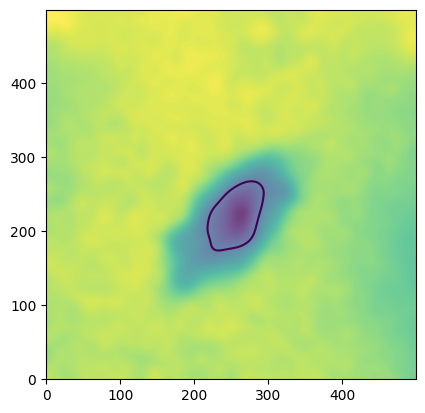

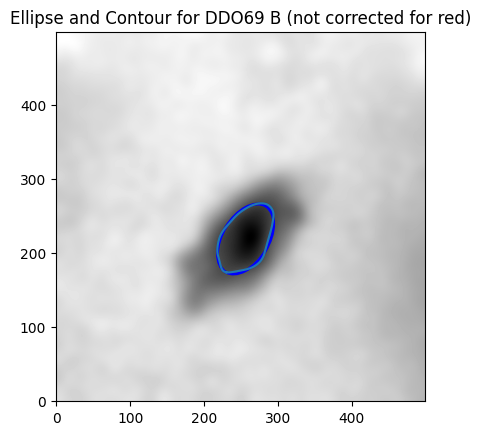

RB 25 for DDO 126 is: 1.4036236548983632 kpc
Paper value is 1.17 kpc


In [18]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 126\non_shifted_background_d126u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 126\non_shifted_background_d126B.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 126\non_shifted_background_d126V.fits")
starless_v = starless_file_v[0].data

DDO126 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO126"
# Constants and parameters
pixel_scale = 1.134
D = 4.9
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.08, 1.00, 1.04]
mU_values = [5.203, 0.5026113, -0.0911, 0.]
mV_values = [3.246, 0.1149137, -0.0167, 0.]
mB_values = [3.668, 0.2268837, -0.0274, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 250
box_size_y = 250
box_center = (520, 460)
image_boxes = [DDO126[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO126))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 126 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.17 kpc")


Median of the center box: -0.08903141118105751


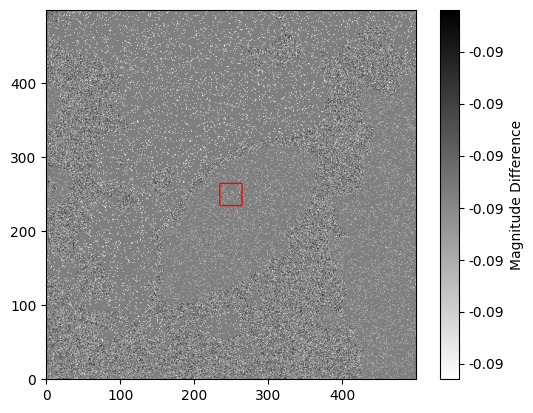

Holmberg mag threshold is 26.70673431973402


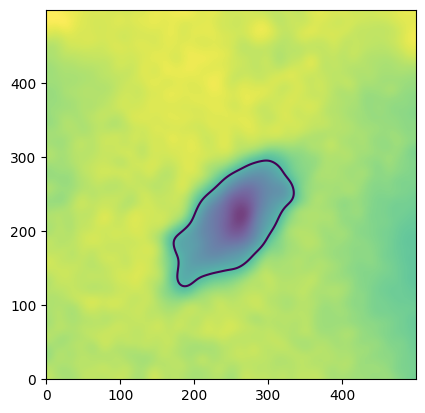

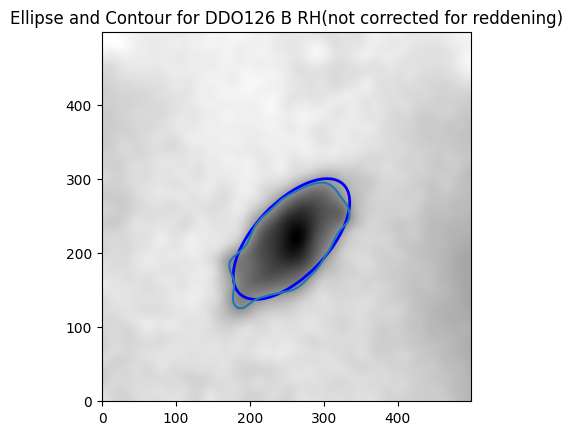

RH for DDO126 is: 2.745007907921046 kpc
Paper value is 2.51 kpc


In [19]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 2.51 kpc")

# DDO 133

## R25

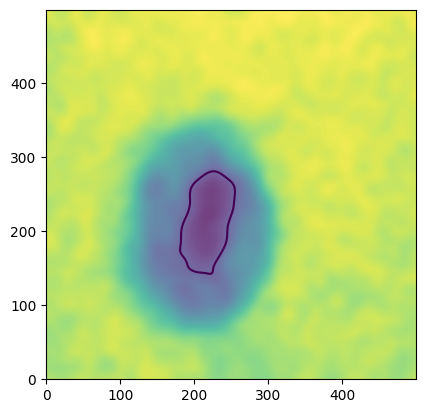

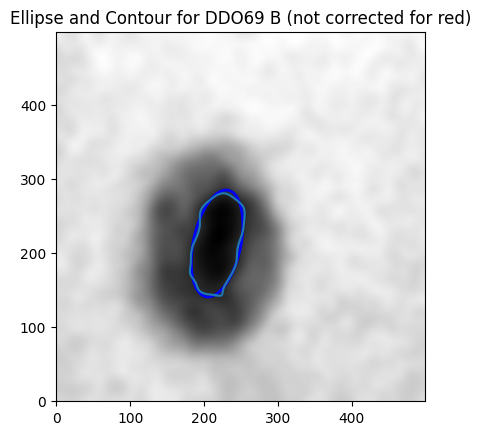

RB 25 for DDO 133 is: 2.467447669208481 kpc
Paper value is 1.89 kpc


In [20]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 133\non_shifted_background_d133u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 133\non_shifted_background_d133b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 133\non_shifted_background_d133v.fits")
starless_v = starless_file_v[0].data

DDO133 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO133"
# Constants and parameters
pixel_scale = 1.134
D = 6.1
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.15, 1.0, 1.035]
mU_values = [5.203, 0.4756422, -0.0911, 0.]
mV_values = [3.246, 0.1009549, -0.0167, 0.]
mB_values = [3.668, 0.2104808, -0.0274, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 250
box_size_y = 250
box_center = (520, 430)
image_boxes = [DDO133[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO133))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 8)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 133 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.89 kpc")


Median of the center box: -0.08658731118105578


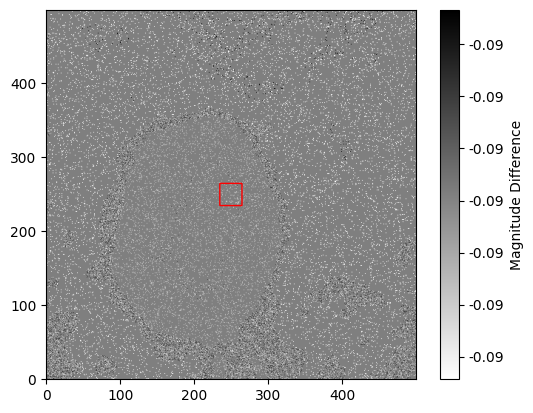

Holmberg mag threshold is 26.70709849063402


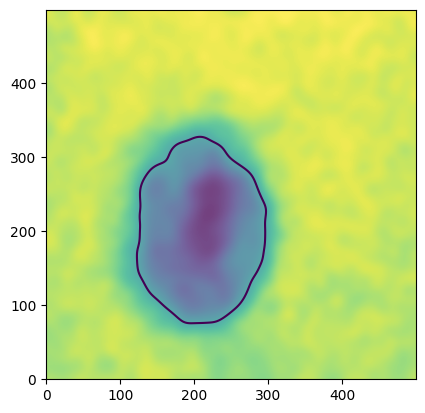

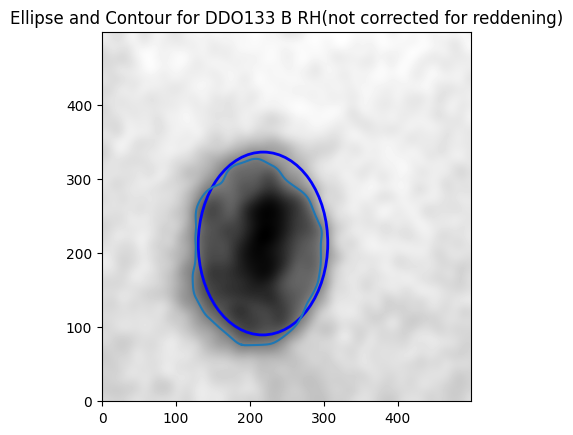

RH for DDO133 is: 4.147287266918725 kpc
Paper value is 4.14 kpc


In [21]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 4.14 kpc")

# DDO 154

## R25

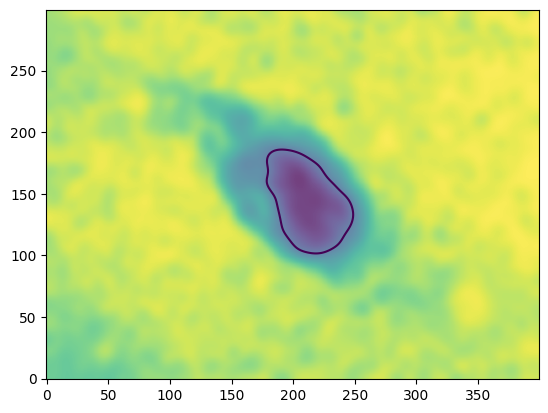

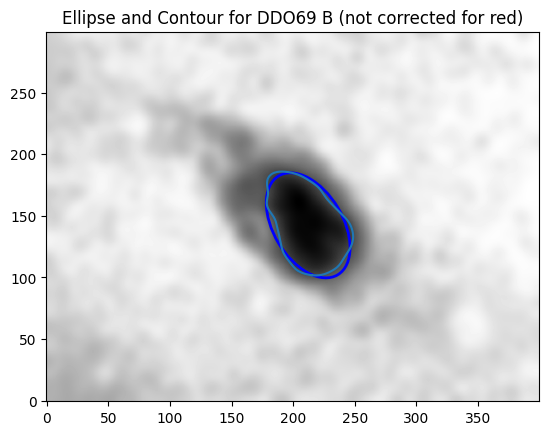

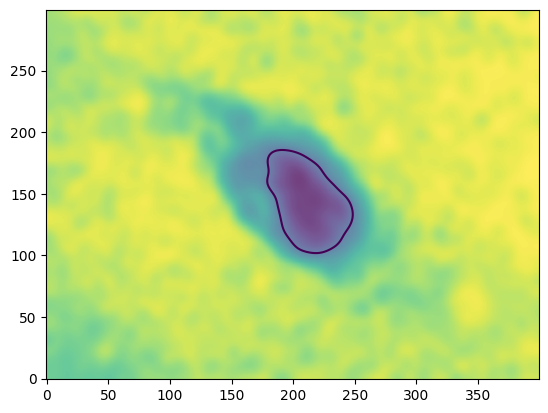

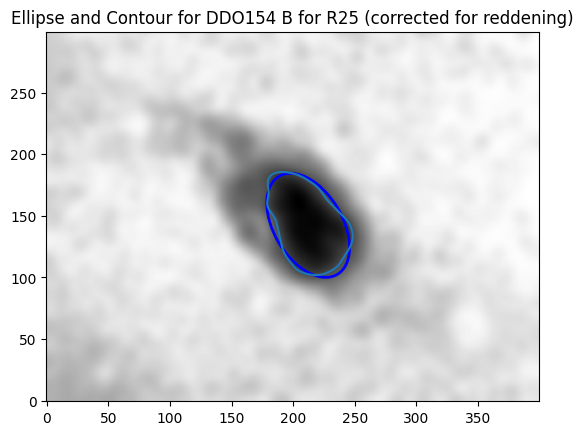

NOT corrected RB 25 for DDO 154 is: 1.1048933334630548 kpc
Paper value is 1.11 kpc
CORRECTED RB 25 for DDO154 is: 1.0940319055606036 kpc
Paper value is 1.11 kpc


In [22]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 154\non_shifted_background_d154u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 154\non_shifted_background_d154b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 154\non_shifted_background_d154v.fits")
starless_v = starless_file_v[0].data

DDO154 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO154"
# Constants and parameters
pixel_scale = 1.134
D = 4.3
E_B_V = 0.01
filters = ["U", "B", "V"]
exposures = [1800, 1200, 600]
airmass_values = [1.16, 1.49, 1.11]
mU_values = [5.196, 0.4683865, -0.093, 0.]
mV_values = [3.017, 0.128904, 0.045, 0.]
mB_values = [3.562, 0.2586217, -0.0166, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 200
box_size_y = 150
box_center = (460, 500)
image_boxes = [DDO154[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO154))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for DDO 154 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.11 kpc")

a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.11 kpc")

## RH

Median of the center box: 0.05065423549220128


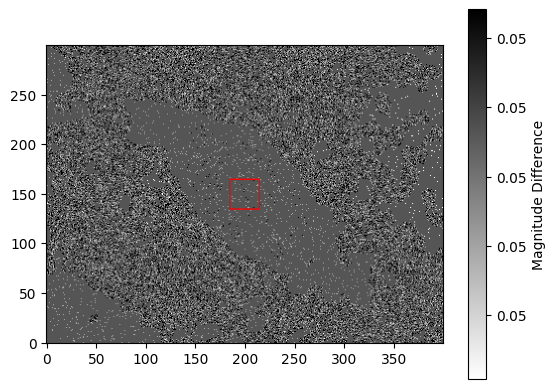

Holmberg mag threshold is 26.727547481088337


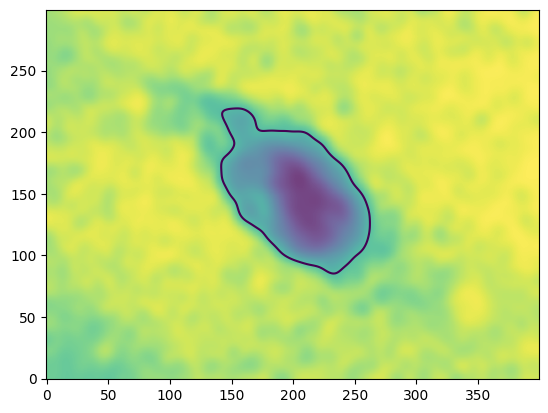

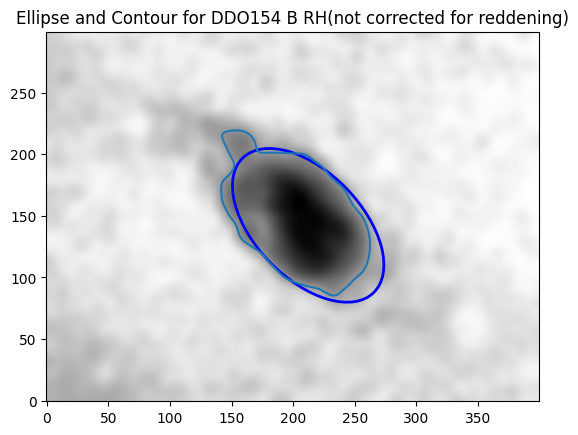

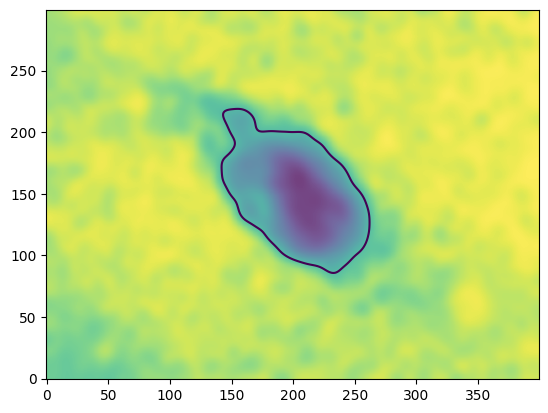

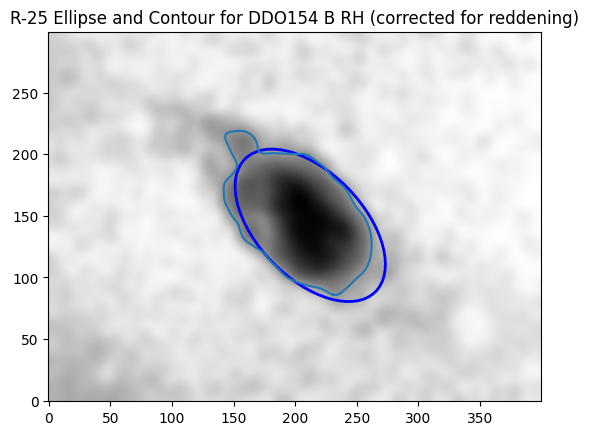

NOT corrected RH for DDO154 is: 1.801535940857117 kpc
CORRECTED RB 25 for DDO154 is: 1.785331527340605 kpc
Paper value is 1.94 kpc


In [23]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = 200, 150
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = b_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 1.94 kpc")

# DDO 165

## R25

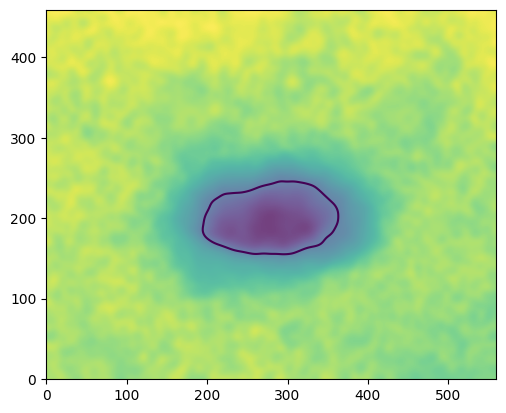

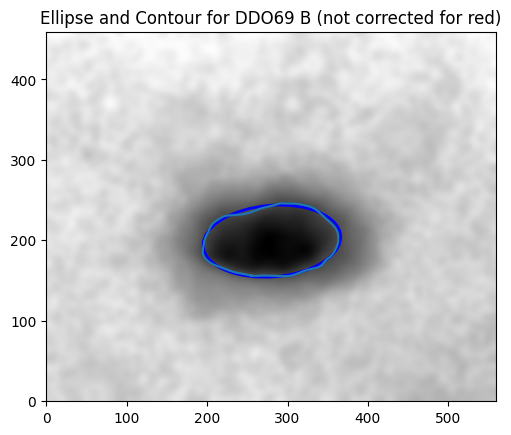

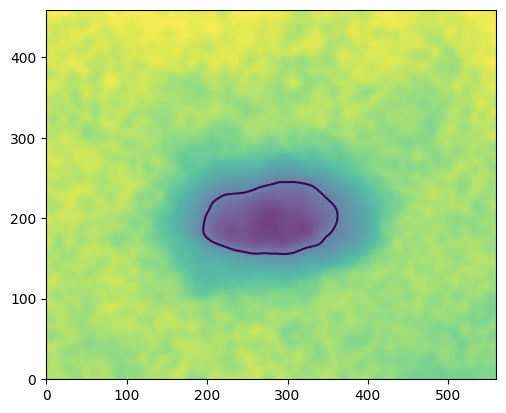

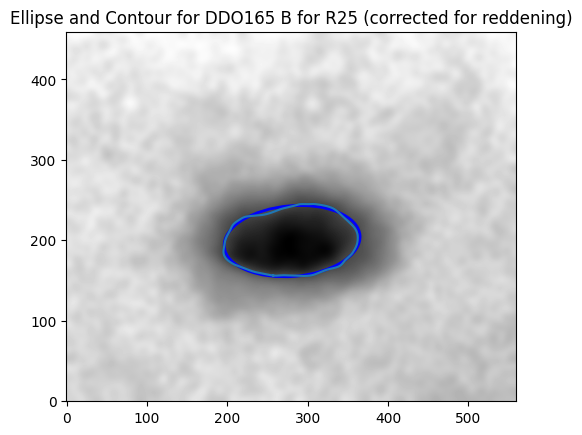

NOT corrected RB 25 for DDO 165 is: 2.262456621666036 kpc
Paper value is 1.97 kpc
CORRECTED RB 25 for DDO165 is: 2.236560322210969 kpc
Paper value is 1.97 kpc


In [24]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 165\non_shifted_background_d165u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 165\non_shifted_background_d165b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 165\non_shifted_background_d165v.fits")
starless_v = starless_file_v[0].data

DDO165 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO165"
# Constants and parameters
pixel_scale = 1.134
D = 4.8
E_B_V = 0.01
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [41.31, 1.18, 1.2]
mU_values = [5.271, 0.48, -0.143, 0.]
mV_values = [3.017, 0.128904, 0.045, 0.]
mB_values = [3.445, 0.2458613, -0.022, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 280
box_size_y = 230
box_center = (460, 480)
image_boxes = [DDO165[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO165))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for DDO 165 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.97 kpc")

a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 1.97 kpc")


## R_H

Median of the center box: -0.1062861804689723


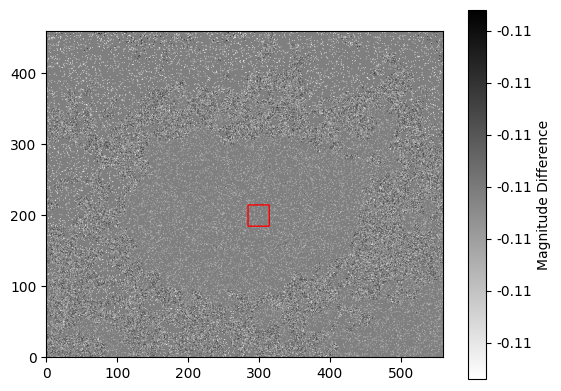

Holmberg mag threshold is 26.704163359110122


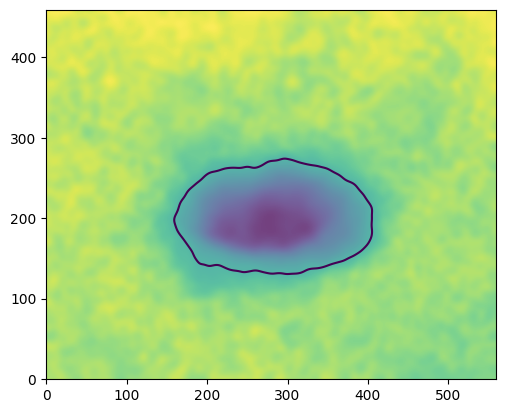

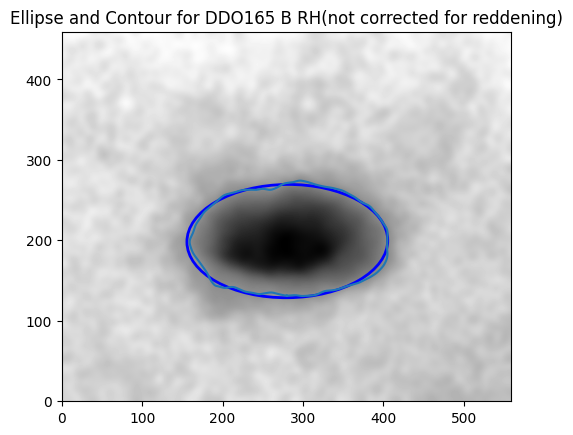

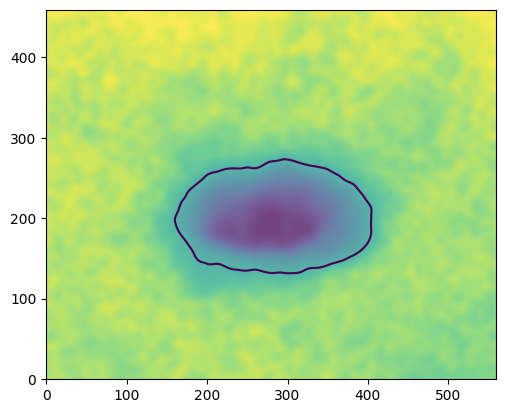

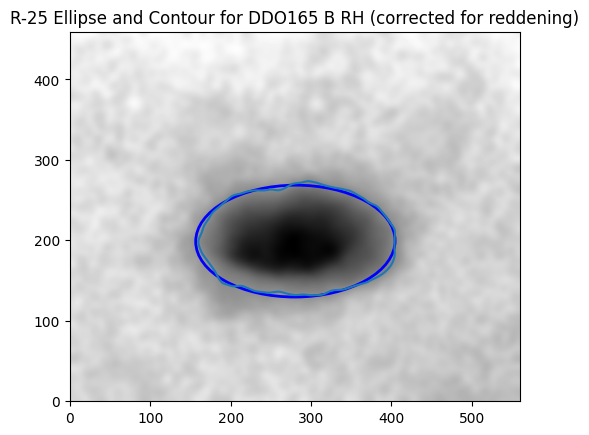

NOT corrected RH for DDO165 is: 3.297870074763445 kpc
CORRECTED RB 25 for DDO165 is: 3.2739048385202123 kpc
Paper value is 2.99 kpc


In [25]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = 300, 200
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = a_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 2.99 kpc")

# DDO 167

## R25

ValueError: max() iterable argument is empty

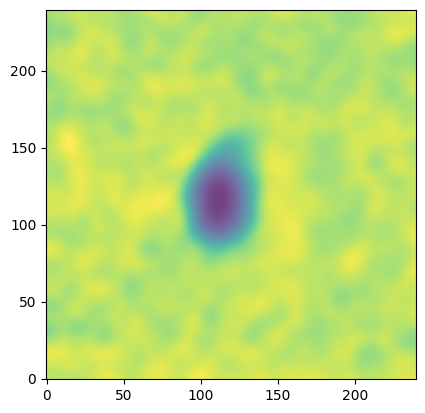

In [26]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 167\non_shifted_background_d167u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 167\non_shifted_background_d167b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 167\non_shifted_background_d167v.fits")
starless_v = starless_file_v[0].data

DDO167 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO167"
# Constants and parameters
pixel_scale = 1.134
D = 4.2
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1200, 900]
airmass_values =[1.73, 1.485, 1.67]
mU_values =[5.7383, -0.04809, 0., 0.]
mV_values = [3.8163, 0.01101, 0., 0.]
mB_values = [3.2426, 0.050240, 0, 0]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 120
box_size_y = 120
box_center = (470, 460)
image_boxes = [DDO167[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO167))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO167 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 167 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.89 kpc")

Median of the center box: 0.8277902915207491


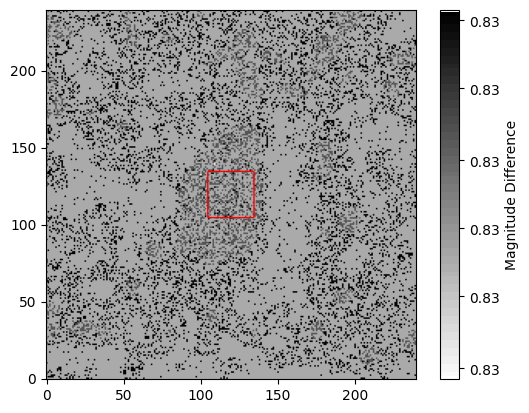

Holmberg mag threshold is 26.84334075343659


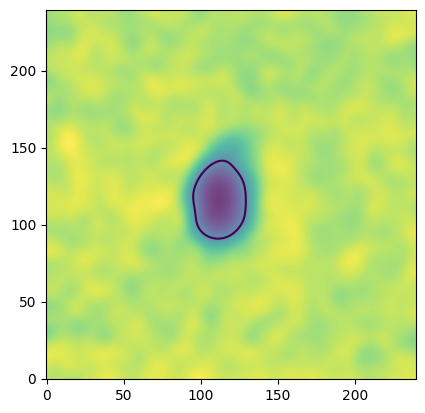

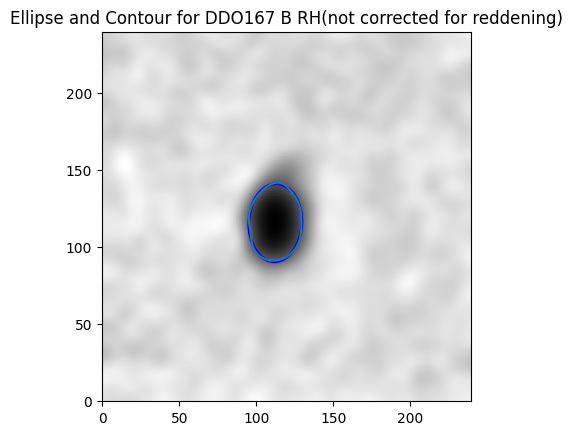

RH for DDO167 is: 0.5843045025241831 kpc
Paper value is 0.91 kpc


In [29]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 0.91 kpc")

# DDO 168

## R25

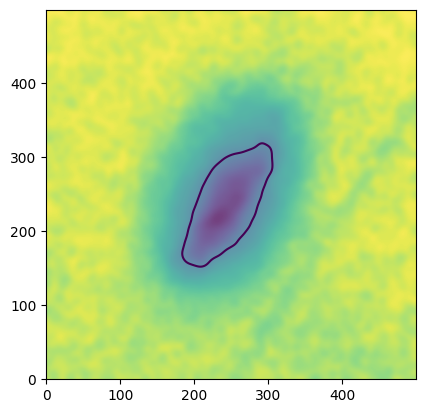

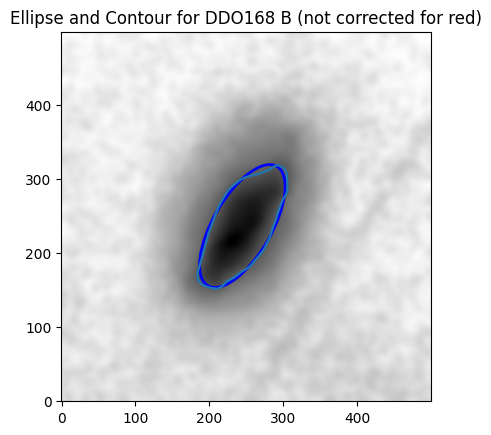

RB 25 for DDO 168 is: 1.7925754977226767 kpc
Paper value is 1.45 kpc


In [ ]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 168\non_shifted_background_d168u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 168\non_shifted_background_d168b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 168\non_shifted_background_d168v.fits")
starless_v = starless_file_v[0].data

DDO168 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO168"
# Constants and parameters
pixel_scale = 1.134
D = 3.5
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values =[1.40, 1.09, 1.08]
mU_values =[5.065, 0.515, -0.146, 0.]
mV_values = [3.017, 0.1511767, 0.045, 0.]
mB_values = [3.445, 0.2373955, -0.022, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 250
box_size_y = 250
box_center = (470, 460)
image_boxes = [DDO168[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO168))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO168 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 168 is:", RB_25 * 1000, "kpc")
print("Paper value is 1.45 kpc")

Median of the center box: -0.05225505846897249


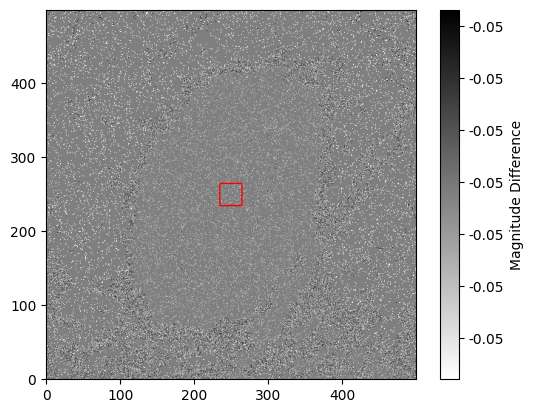

Holmberg mag threshold is 26.71221399628812


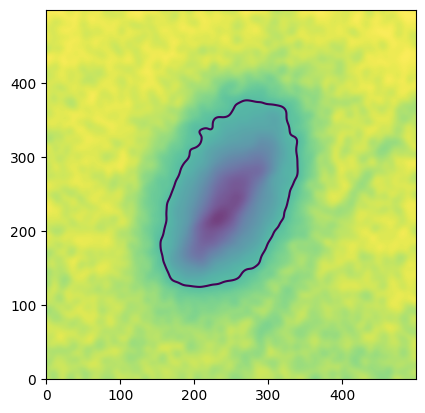

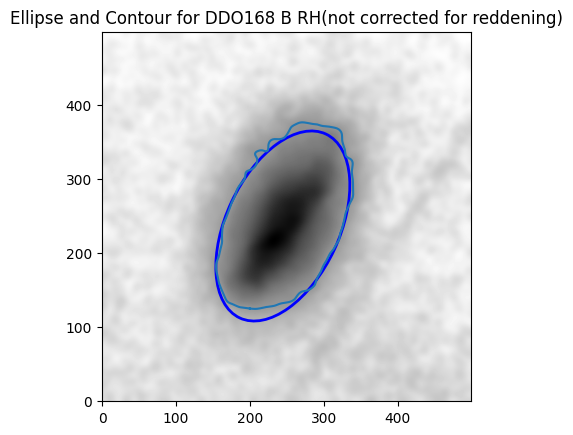

RH for DDO168 is: 2.6428673832004614 kpc
Paper value is 2.36 kpc


In [ ]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = b_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 2.36 kpc")

# DDO 187

## R25

ValueError: max() iterable argument is empty

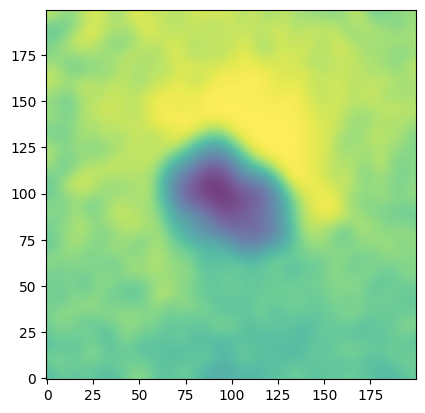

In [30]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 187\non_shifted_background_d187u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 187\non_shifted_background_d187b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\DDO 187\non_shifted_background_d187v.fits")
starless_v = starless_file_v[0].data

DDO187 = [starless_u , starless_b , starless_v]
galaxy_name = "DDO187"
# Constants and parameters
pixel_scale = 1.134
D = 2.5
E_B_V = 0
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.21, 1.1, 1.02]
mU_values = [5.065, 0.562, -0.146, 0.]
mV_values = [3.017, 0.1511767, 0.045, 0.]
mB_values = [3.434, 0.3580121, -0.0157, 0.]
m_values = [mU_values, mB_values, mV_values]

# Crop image to a specific region
box_size_x = 100
box_size_y = 100
box_center = (490, 420)
image_boxes = [DDO187[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(DDO187))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO168 B (not corrected for red)")
plt.show()

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("RB 25 for DDO 168 is:", RB_25 * 1000, "kpc")
print("Paper value is 0.5 kpc")

Median of the center box: -0.17756894379909838


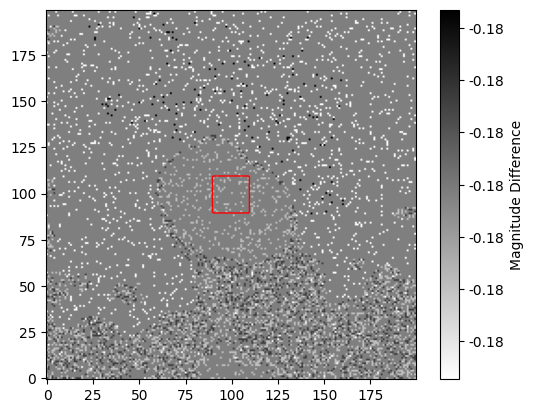

Holmberg mag threshold is 26.693542227373932


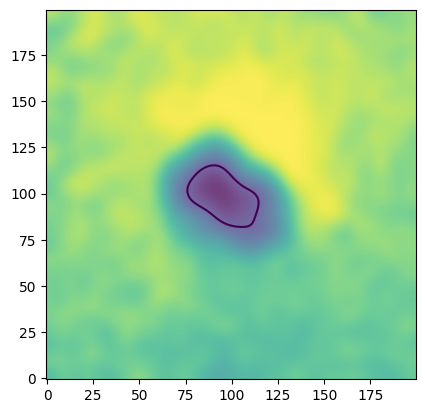

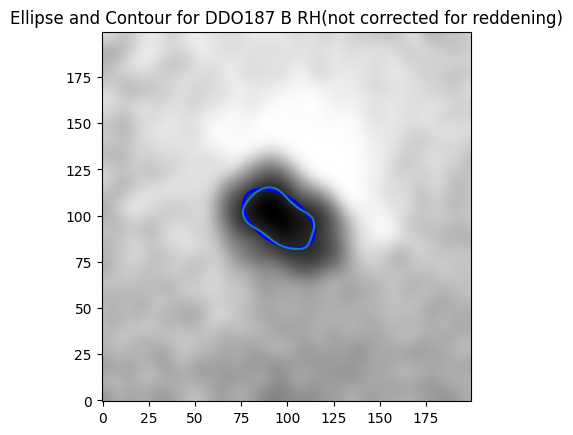

RH for DDO187 is: 0.2967046508434826 kpc
Paper value is 0.77 kpc


In [33]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc_H, yc_H), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")
print("Paper value is 0.77 kpc")

# M81dwA

## R25

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1200.

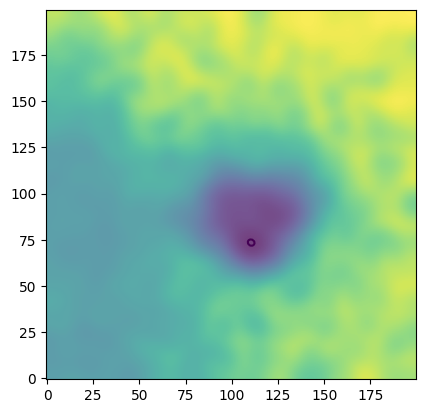

In [37]:
starless_file_u = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\m81dwau\non_shifted_background_m81dwau.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\m81dwau\non_shifted_background_m81dwab.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"c:\Users\AYSAN\Desktop\project\Galaxy\Starless images\m81dwau\non_shifted_background_m81dwav.fits")
starless_v = starless_file_v[0].data

M81dwA = [starless_u , starless_b , starless_v]
galaxy_name = "M81dwA"
# Constants and parameters
pixel_scale = 1.134
D = 3.6
E_B_V = 0.02
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.31, 1.35, 1.42]
mU_values = [5.172179, 0.5305759, -0.1119325, 0.]
mV_values = [3.206747, 0.1810213, -0.01222482, 0.]
mB_values = [3.661739, 0.2671157, -0.01449246, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 100
box_size_y = 100
box_center = (460, 400)
image_boxes = [M81dwA[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(M81dwA))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for DDO69 B (not corrected for red)")
plt.show()
'''
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c

# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 
a_25_arcsec_c = a_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")

'''
# Calculate the physical size
a_25_arcsec = a * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for M81dwA is:", RB_25 * 1000, "kpc")





## RH

Median of the center box: -0.14999301340408563


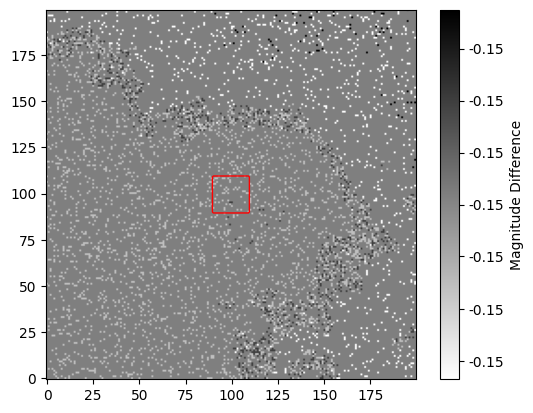

Holmberg mag threshold is 26.69765104100279


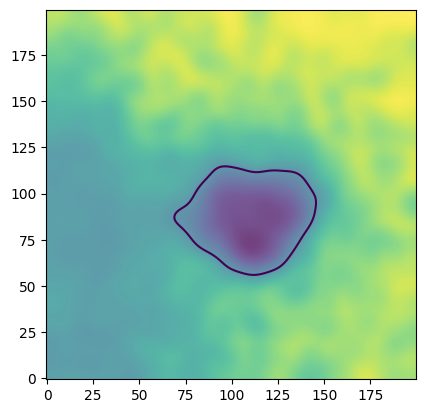

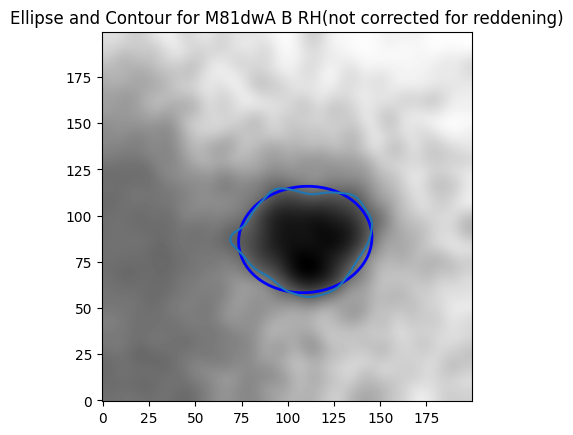

RH for M81dwA is: 0.7147284483099728 kpc


In [39]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = width // 2, height // 2
box_size = 20

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"RH for {galaxy_name} is:", RH * 1000, "kpc")


# NGC 1156

## R25

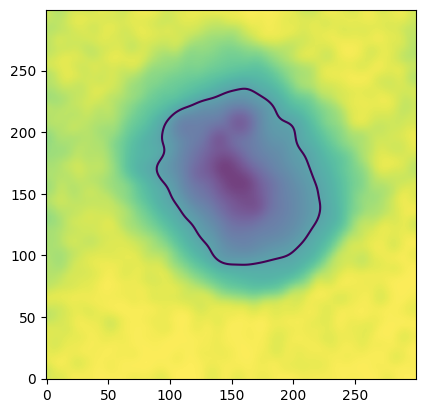

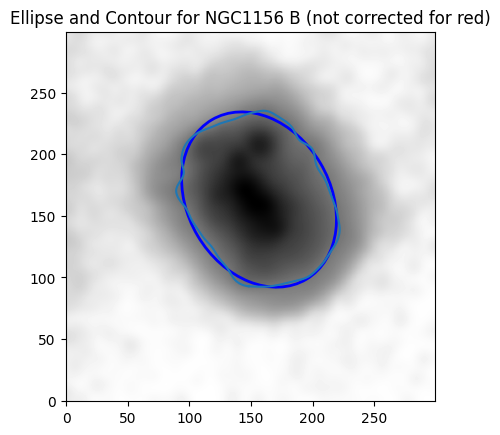

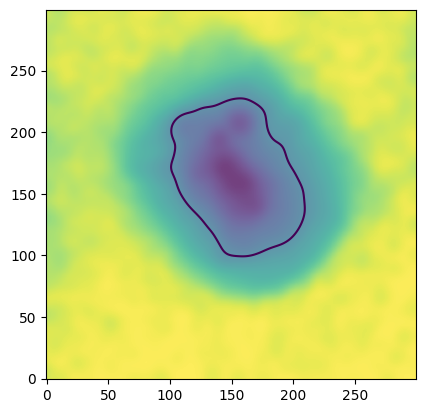

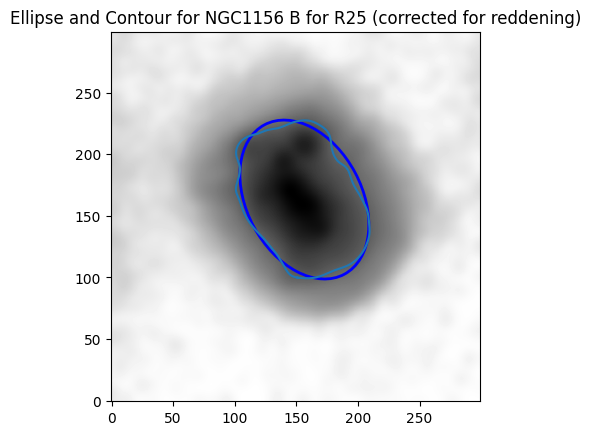

NOT corrected RB 25 for NGC1156 is: 3.225486598483847 kpc
Paper value is 3.8 kpc
CORRECTED RB 25 for NGC1156 is: 2.9481353886751163 kpc
Paper value is 3.8 kpc


In [54]:
starless_file_u = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1156\non_shifted_background_n1156u.fits")
starless_u = starless_file_u[0].data

starless_file_b = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1156\non_shifted_background_n1156b.fits")
starless_b = starless_file_b[0].data

starless_file_v = fits.open(r"C:\Users\AYSAN\Desktop\project\Galaxy\Starless images\NGC 1156\non_shifted_background_n1156v.fits")
starless_v = starless_file_v[0].data

NGC1156 = [starless_u , starless_b , starless_v]
galaxy_name = "NGC1156"
# Constants and parameters
pixel_scale = 1.134
D = 7.8
E_B_V = 0.17
filters = ["U", "B", "V"]
exposures = [1800, 1800, 1200]
airmass_values = [1.02, 1.07, 1.24]
mU_values = [4.97379, 0.6303594, -0.0947, 0.]
mV_values = [3.22, 0.1205604, -0.0141, 0.]
mB_values = [3.652, 0.2300204, -0.0153, 0.]
m_values = [mU_values, mB_values, mV_values]
# Crop image to a specific region
box_size_x = 150
box_size_y = 150
box_center = (460, 480)
image_boxes = [NGC1156[i][box_center[0] - box_size_y: box_center[0] + box_size_y, box_center[1] - box_size_x: box_center[1] + box_size_x] for i in range(len(NGC1156))]

# Magnitude correction
b_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[1]
v_box = ltf.mag_table_correction(image_boxes, airmass_values, m_values, pixel_scale, exposures, 5)[2]

# Contour coordinates
contour_points = ltf.contour_lines_coordinates(b_box, [25])
x_points, y_points = contour_points
# Center of mass for ellipse fitting

image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points) - min(x_points)) / 2, (max(y_points) - min(y_points)) / 2, 0]

# Fit ellipse
popt_25, pcov_25 = curve_fit(ltf.ellipse, (x_points, y_points), np.zeros_like(x_points), p0=initial_guess)
xc, yc, a, b, theta = popt_25

# Plot the image, contour, and ellipse
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points, y_points)
ellipse = Ellipse(xy=(xc, yc), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title("Ellipse and Contour for NGC1156 B (not corrected for red)")
plt.show()

#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c = ltf.contour_lines_coordinates(b_box_corrected, [25])
x_points_c, y_points_c = contour_points_c
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c = [x, y, (max(x_points_c) - min(x_points_c)) / 2, (max(y_points_c) - min(y_points_c)) / 2, 0]
# Fit ellipse
popt_25_c, pcov_25_c = curve_fit(ltf.ellipse, (x_points_c, y_points_c), np.zeros_like(x_points_c), p0=initial_guess_c)
xc_c, yc_c, a_c, b_c, theta_c = popt_25_c
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected, cmap='gray', origin='lower')
ax.plot(x_points_c, y_points_c)
ellipse_c = Ellipse(xy=(xc, yc), width=2*a_c, height=2*b_c, angle=np.degrees(theta_c), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c)
plt.title(f"Ellipse and Contour for {galaxy_name} B for R25 (corrected for reddening)")
plt.show() 

# Calculate the physical size
a_25_arcsec = b * pixel_scale
RB_25 = (D * a_25_arcsec) / 206265
print("NOT corrected RB 25 for NGC1156 is:", RB_25 * 1000, "kpc")
print("Paper value is 3.8 kpc")

a_25_arcsec_c = b_c * pixel_scale
RB_25_c = (D * a_25_arcsec_c) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RB_25_c * 1000, "kpc")
print("Paper value is 3.8 kpc")


Median of the center box: -0.2783657785836323


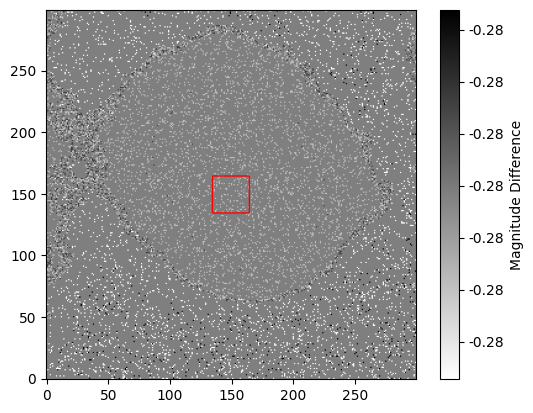

Holmberg mag threshold is 26.678523498991037


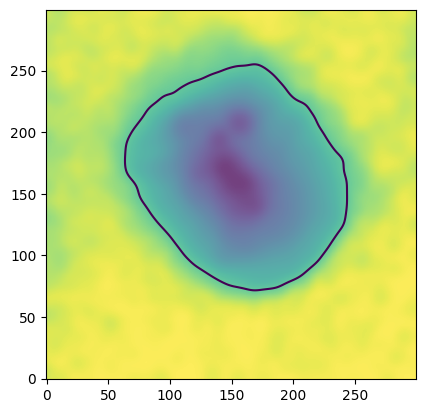

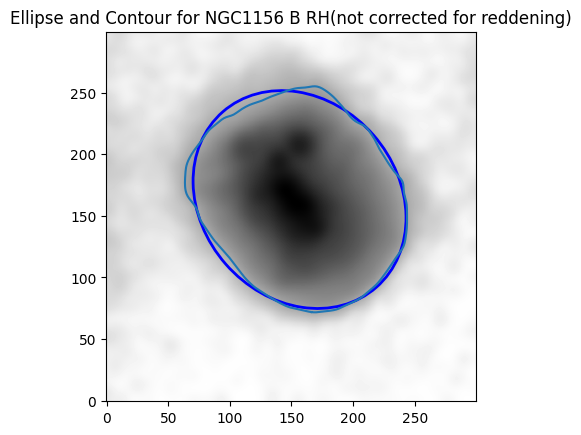

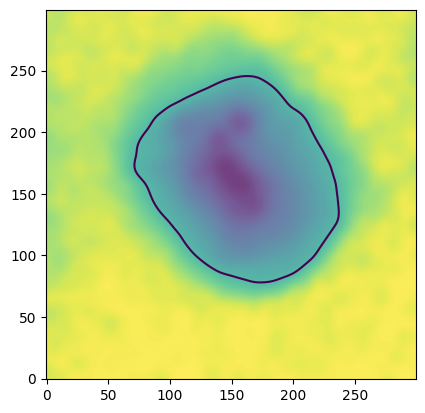

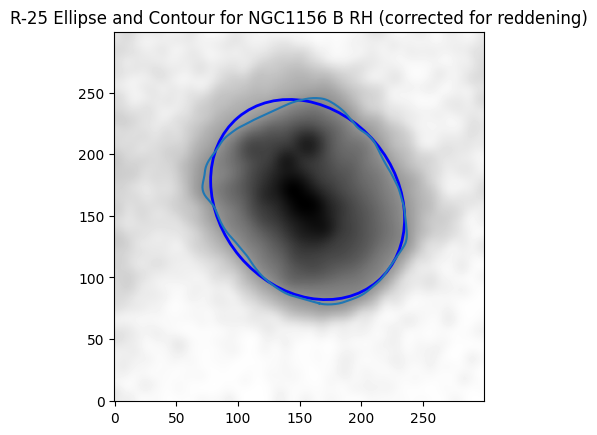

NOT corrected RH for NGC1156 is: 4.057364605765752 kpc
CORRECTED RB 25 for NGC1156 is: 3.74508625384481 kpc
Paper value is 4.86 kpc


: 

In [ ]:
B_V_magnitude_table = b_box - v_box - E_B_V

# Get the dimensions of the image
height, width = B_V_magnitude_table.shape

# Calculate the coordinates for the center box
center_x, center_y = 150, 150
box_size = 30

# Extract the center box
center_box = B_V_magnitude_table[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2]

# Calculate the median of the center box
median_center_box = np.nanmedian(center_box)

print("Median of the center box:", median_center_box)

# Plot the image with the box
fig, ax = plt.subplots()
im = ax.imshow(B_V_magnitude_table, origin='lower', cmap='gray_r')  # Use inverted grayscale colormap
cbar = fig.colorbar(im, ax=ax, format='%.2f')
cbar.set_label('Magnitude Difference')

# Add the box to the image
box_mask = np.zeros_like(B_V_magnitude_table, dtype=bool)
box_mask[center_y - box_size // 2:center_y + box_size // 2, center_x - box_size // 2:center_x + box_size // 2] = True
ax.contour(box_mask, colors='red', linewidths=1)

plt.show()
#Holmberg magnitude:
H = float(26.5 + 0.22 + 0.149*(median_center_box))
print(f"Holmberg mag threshold is {H}")

# Contour coordinates
contour_points_H = ltf.contour_lines_coordinates(b_box, [H])
x_points_H, y_points_H = contour_points_H
# Center of mass for ellipse fitting
image_center_of_mass = ndimage.center_of_mass(b_box)
x, y = image_center_of_mass[1], image_center_of_mass[0]
initial_guess = [x, y, (max(x_points_H) - min(x_points_H)) / 2, (max(y_points_H) - min(y_points_H)) / 2, 0]
# Fit ellipse
popt_25_H, pcov_25_H = curve_fit(ltf.ellipse, (x_points_H, y_points_H), np.zeros_like(x_points_H), p0=initial_guess)
xc_H, yc_H, a_H, b_H, theta_H = popt_25_H
# Plot the image, contour, and ellipse (not reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box, cmap='gray', origin='lower')
ax.plot(x_points_H, y_points_H)
ellipse = Ellipse(xy=(xc, yc), width=2*a_H, height=2*b_H, angle=np.degrees(theta_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse)
plt.title(f"Ellipse and Contour for {galaxy_name} B RH(not corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
b_box_corrected_H = ltf.correct_reddening_B(b_box, E_B_V)
contour_points_c_H = ltf.contour_lines_coordinates(b_box_corrected_H,[H])
x_points_c_H, y_points_c_H = contour_points_c_H
# Center of mass for ellipse fitting
image_center_of_mass_c = ndimage.center_of_mass(b_box_corrected_H)
x, y = image_center_of_mass_c[1], image_center_of_mass_c[0]
initial_guess_c_H = [x, y, (max(x_points_c_H) - min(x_points_c_H)) / 2, (max(y_points_c_H) - min(y_points_c_H)) / 2, 0]
# Fit ellipse
popt_25_c_H, pcov_25_c_H = curve_fit(ltf.ellipse, (x_points_c_H, y_points_c_H), np.zeros_like(x_points_c_H), p0=initial_guess_c_H)
xc_c_H, yc_c_H, a_c_H, b_c_H, theta_c_H = popt_25_c_H
# Plot the image, contour, and ellipse (reddening corrected)
fig, ax = plt.subplots()
ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
cax = ax.imshow(b_box_corrected_H, cmap='gray', origin='lower')
ax.plot(x_points_c_H, y_points_c_H)
ellipse_c_H = Ellipse(xy=(xc, yc), width=2*a_c_H, height=2*b_c_H, angle=np.degrees(theta_c_H), edgecolor='blue', facecolor='none', linewidth=2)
ax.add_patch(ellipse_c_H)
plt.title(f"R-25 Ellipse and Contour for {galaxy_name} B RH (corrected for reddening)")
plt.show()
#-------------------------------------------------------------------------------------------------------------------------------------------------#
# Calculate the physical size
a_25_arcsec_H = a_H * pixel_scale
RH = (D * a_25_arcsec_H) / 206265
print(f"NOT corrected RH for {galaxy_name} is:", RH * 1000, "kpc")
a_25_arcsec_c_H = a_c_H * pixel_scale
RH_c = (D * a_25_arcsec_c_H) / 206265
print(f"CORRECTED RB 25 for {galaxy_name} is:", RH_c * 1000, "kpc")
print("Paper value is 4.86 kpc")